In [40]:
import numpy as np
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from PIL import Image
import os

%matplotlib inline 

In [2]:
#function hiện thị ảnh
def show_images(*images):
    # Tạo một khung đồ thị với 1 hàng và số lượng hình ảnh cột
    fig, axs = plt.subplots(1, len(images), figsize=(5 * len(images), 5))

    # Nếu chỉ có một hình ảnh, axs sẽ không phải là một mảng
    # Do đó, chúng ta cần chuyển nó thành một mảng để có thể lặp qua nó
    if len(images) == 1:
        axs = [axs]

    # Hiện thị ảnh
    for i, img in enumerate(images):
        # Nếu mà số chiều của ảnh < 3 thì hiện thị ảnh xám
        if img.ndim < 3:
            axs[i].imshow(img, cmap='gray')
        else:
            axs[i].imshow(img)
        axs[i].set_title(f'Image {i+1}')

    plt.show()


# Bài 1

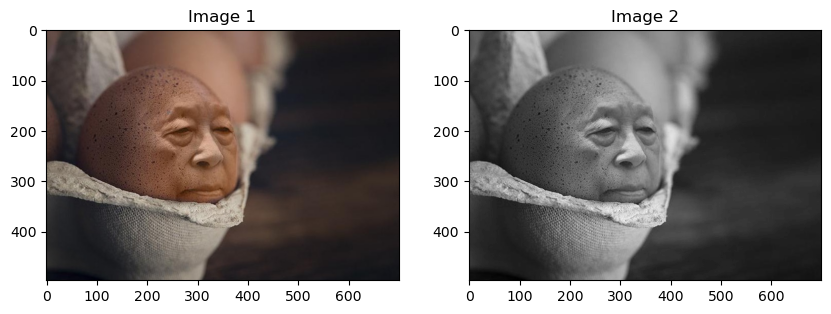

In [3]:
#read image
color_img_1 = plt.imread("C:/Users/trand/Documents/Digital Image Processing/lab03/data/img1.jpg")
# Convert Image into Gray
gray_img_1 = cv2.cvtColor(color_img_1, cv2.COLOR_RGB2GRAY)
show_images(color_img_1,gray_img_1)

Filtering Kernel 3x3:


array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

Filtering Kernel 5x5:


array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

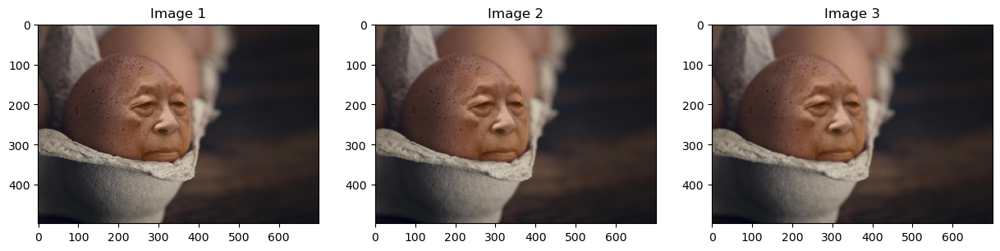

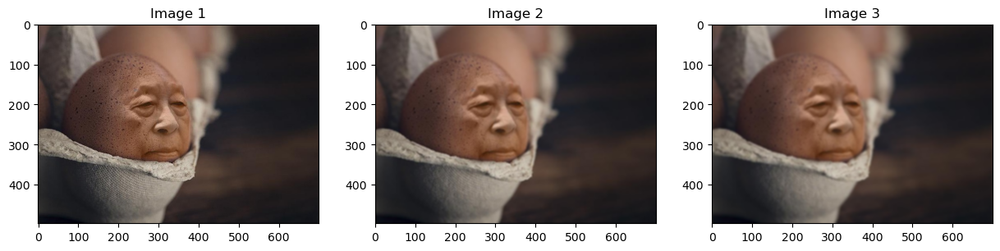

In [4]:
# Tạo kernel 3x3 và 5x5
kernel_3x3 = np.ones((3,3),np.float32)/9
kernel_5x5 = np.ones((5,5),np.float32)/25

#Hiện thị kernel
print("Filtering Kernel 3x3:")
display(kernel_3x3)
print("Filtering Kernel 5x5:")
display(kernel_5x5)

#Làm mờ
#áp kernel 3x3 lên ảnh màu ban đầu
image_filter_3x3_01 = cv2.filter2D(color_img_1,-1,kernel_3x3)
#áp thêm kernel 3x3 lên ảnh để áp kernel trước đó 
image_filter_3x3_02 = cv2.filter2D(image_filter_3x3_01,-1,kernel_3x3)
#Hiện thị ảnh
show_images(color_img_1,image_filter_3x3_01,image_filter_3x3_02)


#áp kernel 5x5 lên ảnh màu ban đầu
image_filter_5x5_01 = cv2.filter2D(color_img_1,-1,kernel_5x5)
#áp thêm kernel 5x5 lên ảnh để áp kernel trước đó 
image_filter_5x5_02 = cv2.filter2D(image_filter_5x5_01,-1,kernel_5x5)
show_images(color_img_1,image_filter_5x5_01,image_filter_5x5_02)


In [5]:
#Function print blur measurement value
def variance_of_Laplacian(img):
    blur_mensurement = cv2.Laplacian(img, cv2.CV_64F).var()
    return blur_mensurement

Giá trị phương sai của Laplacian dùng để đo mức độ mờ của ảnh tức ảnh càng mờ thì giá trị càng thấp

In [6]:
print(f'Gía trị đo độ mờ của ảnh color_img_1:\t\t{variance_of_Laplacian(color_img_1)}')

print(f'\nGía trị đo độ mờ của ảnh image_filter_3x3_01:\t{variance_of_Laplacian(image_filter_3x3_01)}')

print(f'\nGía trị đo độ mờ của ảnh image_filter_3x3_02:\t{variance_of_Laplacian(image_filter_3x3_02)}')


Gía trị đo độ mờ của ảnh color_img_1:		222.89497928062684

Gía trị đo độ mờ của ảnh image_filter_3x3_01:	18.86974615558225

Gía trị đo độ mờ của ảnh image_filter_3x3_02:	6.752626155318604


In [7]:
print(f'Gía trị đo độ mờ của ảnh color_img_1:\t\t{variance_of_Laplacian(color_img_1)}')

print(f'\nGía trị đo độ mờ của ảnh image_filter_5x5_01:\t{variance_of_Laplacian(image_filter_5x5_01)}')

print(f'\nGía trị đo độ mờ của ảnh image_filter_5x5_02:\t{variance_of_Laplacian(image_filter_5x5_02)}')

Gía trị đo độ mờ của ảnh color_img_1:		222.89497928062684

Gía trị đo độ mờ của ảnh image_filter_5x5_01:	5.165814878429109

Gía trị đo độ mờ của ảnh image_filter_5x5_02:	2.1357296125943765


In [8]:
#Function viết giá trị mờ lên ảnh
def input_measurement_text(img,text):
    fm = variance_of_Laplacian(img)
    img_texted = img.copy()
    cv2.putText(img_texted, "{}: {:.2f}".format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
    show_images(img,img_texted)

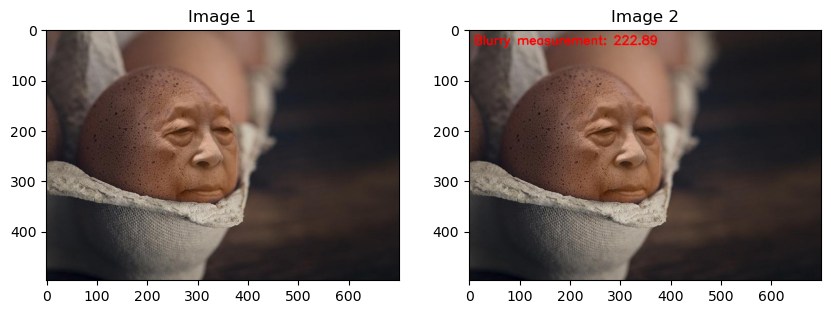

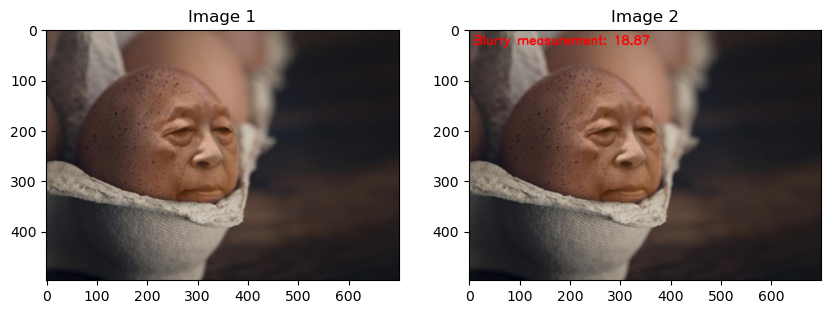

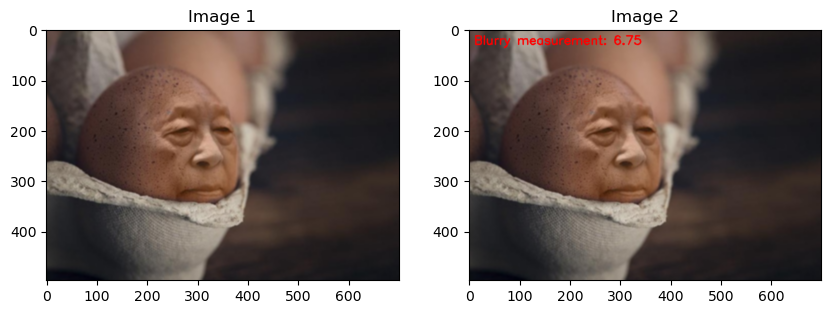

In [9]:
#ảnh gốc
text = "Blurry measurement"
input_measurement_text(color_img_1,text)

#ảnh mờ bằng kernel 3x3
input_measurement_text(image_filter_3x3_01,text)

#ảnh mờ bằng kernel 3x3 2 lần
input_measurement_text(image_filter_3x3_02,text)

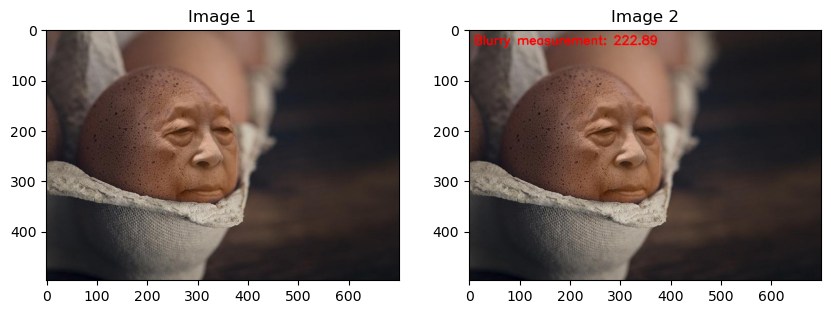

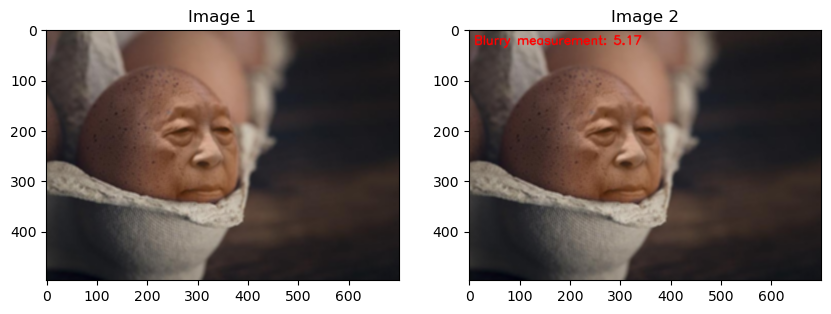

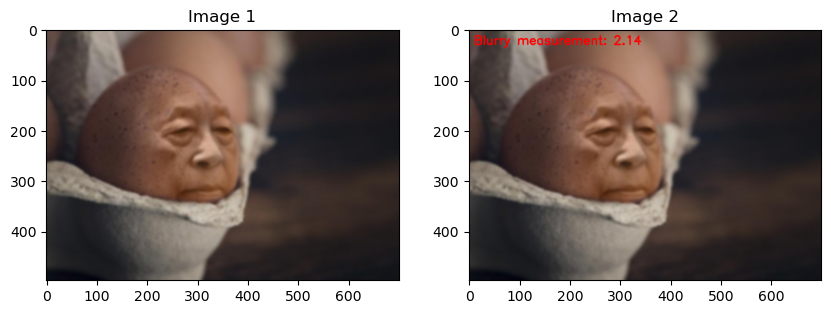

In [10]:
#ảnh gốc
input_measurement_text(color_img_1,text)

#ảnh mờ bằng kernel 5x5
input_measurement_text(image_filter_5x5_01,text)

#ảnh mờ bằng kernel 5x5 2 lần
input_measurement_text(image_filter_5x5_02,text)

# ảnh xám


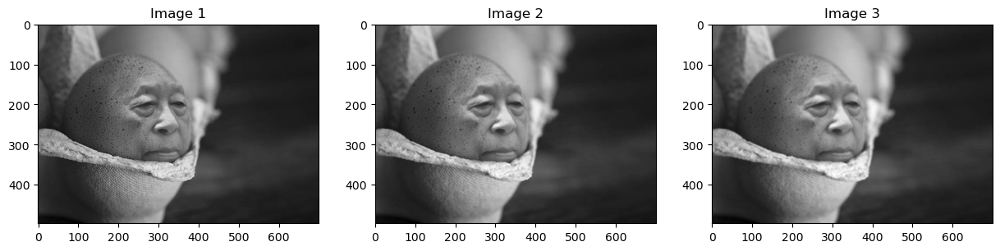

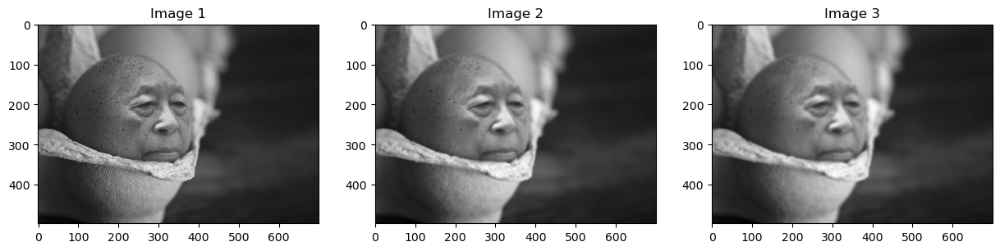

In [11]:
#Làm mờ
#áp kernel 3x3 lên ảnh màu ban đầu
gray_image_filter_3x3_01 = cv2.filter2D(gray_img_1,-1,kernel_3x3)
#áp thêm kernel 3x3 lên ảnh để áp kernel trước đó 
gray_image_filter_3x3_02 = cv2.filter2D(gray_image_filter_3x3_01,-1,kernel_3x3)
#Hiện thị ảnh
show_images(gray_img_1,gray_image_filter_3x3_01,gray_image_filter_3x3_02)


#áp kernel 5x5 lên ảnh màu ban đầu
gray_image_filter_5x5_01 = cv2.filter2D(gray_img_1,-1,kernel_5x5)
#áp thêm kernel 5x5 lên ảnh để áp kernel trước đó 
gray_image_filter_5x5_02 = cv2.filter2D(gray_image_filter_5x5_01,-1,kernel_5x5)
#Hiện thị ảnh
show_images(gray_img_1,gray_image_filter_5x5_01,gray_image_filter_5x5_02)

In [12]:
print(f'Gía trị đo độ mờ của ảnh gray_img_1:\t\t{variance_of_Laplacian(gray_img_1)}')

print(f'\nGía trị đo độ mờ của ảnh gray_image_filter_3x3_01:\t{variance_of_Laplacian(gray_image_filter_3x3_01)}')

print(f'\nGía trị đo độ mờ của ảnh gray_image_filter_3x3_02:\t{variance_of_Laplacian(gray_image_filter_3x3_02)}')

Gía trị đo độ mờ của ảnh gray_img_1:		221.6377502149679

Gía trị đo độ mờ của ảnh gray_image_filter_3x3_01:	18.780731273784045

Gía trị đo độ mờ của ảnh gray_image_filter_3x3_02:	6.720948462474434


In [13]:
print(f'Gía trị đo độ mờ của ảnh gray_img_1:\t\t{variance_of_Laplacian(gray_img_1)}')

print(f'\nGía trị đo độ mờ của ảnh gray_image_filter_5x5_01:\t{variance_of_Laplacian(gray_image_filter_5x5_01)}')

print(f'\nGía trị đo độ mờ của ảnh gray_image_filter_5x5_02:\t{variance_of_Laplacian(gray_image_filter_5x5_02)}')

Gía trị đo độ mờ của ảnh gray_img_1:		221.6377502149679

Gía trị đo độ mờ của ảnh gray_image_filter_5x5_01:	5.132837020017695

Gía trị đo độ mờ của ảnh gray_image_filter_5x5_02:	2.1191491796093356


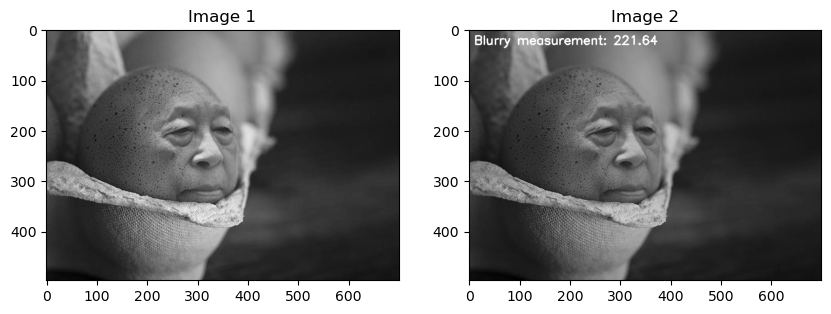

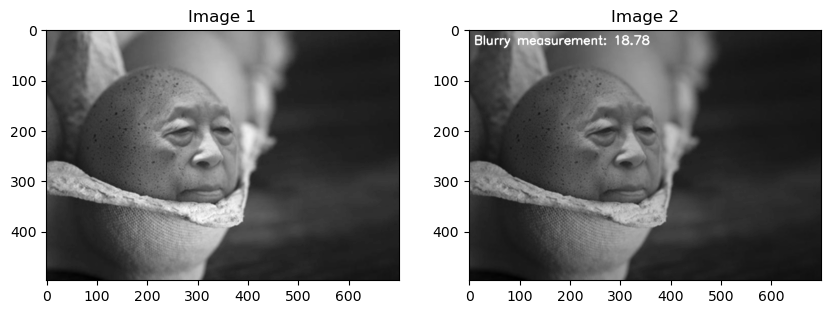

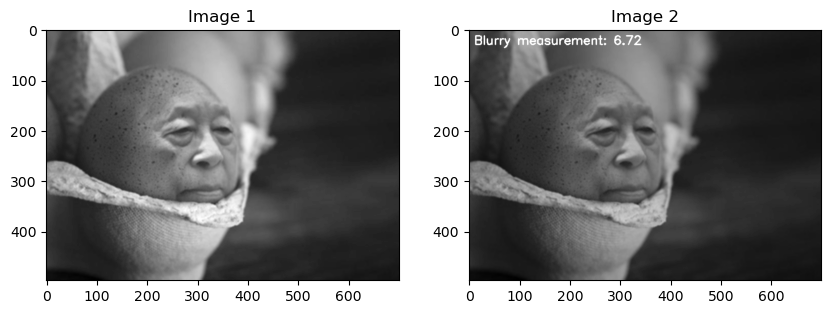

In [14]:
#ảnh xám gốc
input_measurement_text(gray_img_1,text)

#ảnh mờ bằng kernel 3x3
input_measurement_text(gray_image_filter_3x3_01,text)

#ảnh mờ bằng kernel 3x3 2 lần
input_measurement_text(gray_image_filter_3x3_02,text)

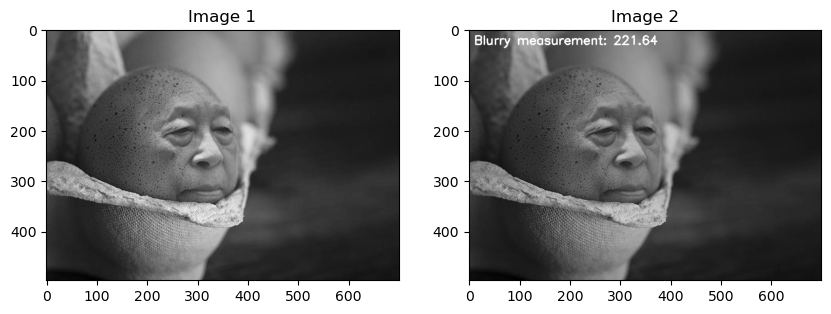

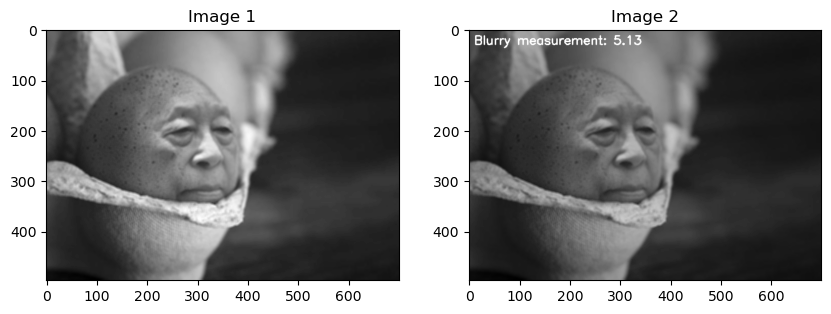

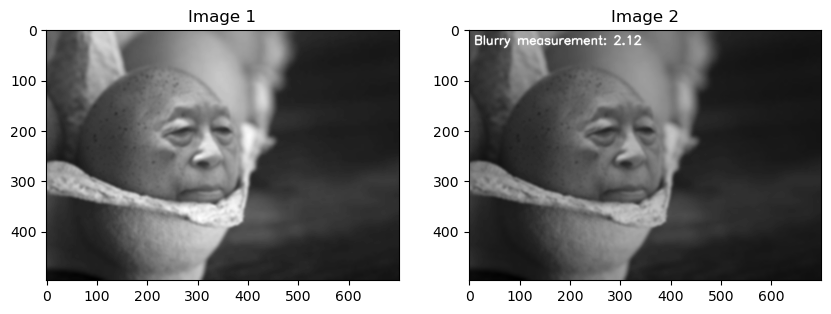

In [15]:
#ảnh xám gốc
input_measurement_text(gray_img_1,text)

#ảnh mờ bằng kernel 5x5
input_measurement_text(gray_image_filter_5x5_01,text)

#ảnh mờ bằng kernel 5x5 2 lần
input_measurement_text(gray_image_filter_5x5_02,text)

# Bài 2

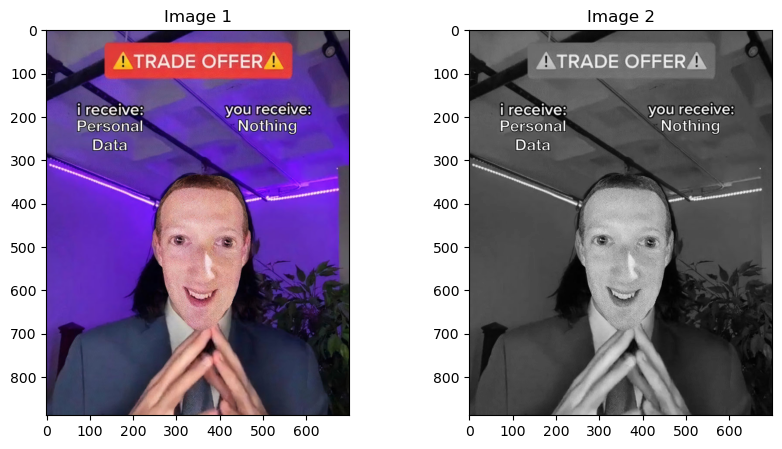

In [16]:
#read img
color_img_2 = plt.imread("C:/Users/trand/Documents/Digital Image Processing/lab03/data/img2.jpg")
#convert to gray
gray_img_2 = cv2.cvtColor(color_img_2, cv2.COLOR_RGB2GRAY)
#show imgs
show_images(color_img_2,gray_img_2)

In [17]:
#Create sharp kernel 3x3
sharp_kernel_3x3 = np.array([
    [0,-1,0],
    [-1,5,-1],
    [0,-1,0]])
display(sharp_kernel_3x3)

#Create sharp kernel 5x5
sharp_kernel_5x5 = np.array([
    [0, 0, -1, 0, 0],
    [0, -1, -2, -1, 0],
    [-1, -2, 17, -2, -1],
    [0, -1, -2, -1, 0],
    [0, 0, -1, 0, 0]
])
display(sharp_kernel_5x5)

array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

array([[ 0,  0, -1,  0,  0],
       [ 0, -1, -2, -1,  0],
       [-1, -2, 17, -2, -1],
       [ 0, -1, -2, -1,  0],
       [ 0,  0, -1,  0,  0]])

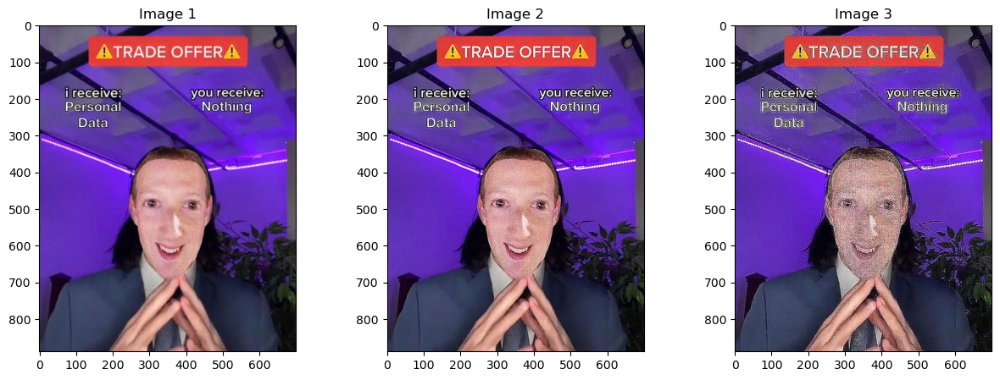

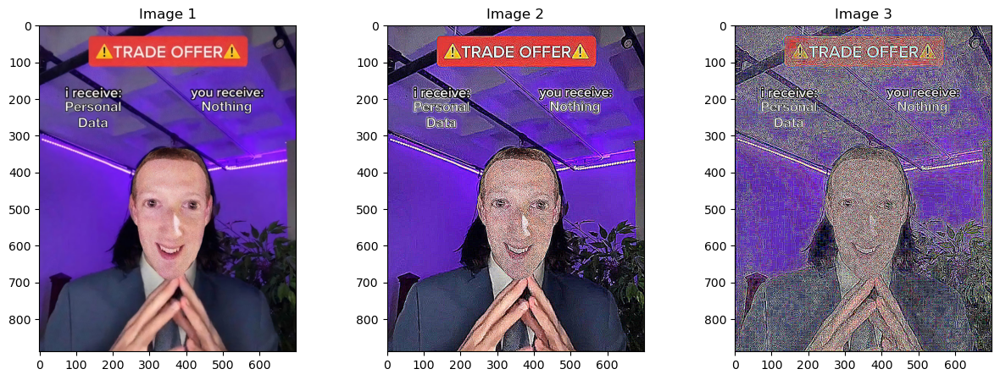

In [18]:
#làm rõ
#áp kernel làm rõ 3x3 lên ảnh màu ban đầu
sharp_image_filter_3x3_01 = cv2.filter2D(color_img_2,-1,sharp_kernel_3x3)
#áp thêm kernel 3x3 lên ảnh để áp kernel trước đó 
sharp_image_filter_3x3_02 = cv2.filter2D(sharp_image_filter_3x3_01,-1,sharp_kernel_3x3)
#Hiện thị ảnh
show_images(color_img_2,sharp_image_filter_3x3_01,sharp_image_filter_3x3_02)


#áp kernel 5x5 lên ảnh màu ban đầu
sharp_image_filter_5x5_01 = cv2.filter2D(color_img_2,-1,sharp_kernel_5x5)
#áp thêm kernel 5x5 lên ảnh để áp kernel trước đó 
sharp_image_filter_5x5_02 = cv2.filter2D(sharp_image_filter_5x5_01,-1,sharp_kernel_5x5)
show_images(color_img_2,sharp_image_filter_5x5_01,sharp_image_filter_5x5_02)


In [19]:
print(f'Gía trị đo độ sắc nét của ảnh color_img_2:\t\t{variance_of_Laplacian(color_img_2)}')

print(f'\nGía trị đo độ sắc nét của ảnh sharp_image_filter_3x3_01:\t{variance_of_Laplacian(sharp_image_filter_3x3_01)}')

print(f'\nGía trị đo độ sắc nét của ảnh sharp_image_filter_3x3_02:\t{variance_of_Laplacian(sharp_image_filter_3x3_02)}')


Gía trị đo độ sắc nét của ảnh color_img_2:		499.1716510160233

Gía trị đo độ sắc nét của ảnh sharp_image_filter_3x3_01:	4061.286391671951

Gía trị đo độ sắc nét của ảnh sharp_image_filter_3x3_02:	39055.19603538744


In [20]:
print(f'Gía trị đo độ sắc nét của ảnh color_img_2:\t\t{variance_of_Laplacian(color_img_2)}')

print(f'\nGía trị đo độ sắc nét của ảnh sharp_image_filter_5x5_01:\t{variance_of_Laplacian(sharp_image_filter_5x5_01)}')

print(f'\nGía trị đo độ sắc nét của ảnh sharp_image_filter_5x5_02:\t{variance_of_Laplacian(sharp_image_filter_5x5_02)}')

Gía trị đo độ sắc nét của ảnh color_img_2:		499.1716510160233

Gía trị đo độ sắc nét của ảnh sharp_image_filter_5x5_01:	19665.188711798604

Gía trị đo độ sắc nét của ảnh sharp_image_filter_5x5_02:	162264.17774540346


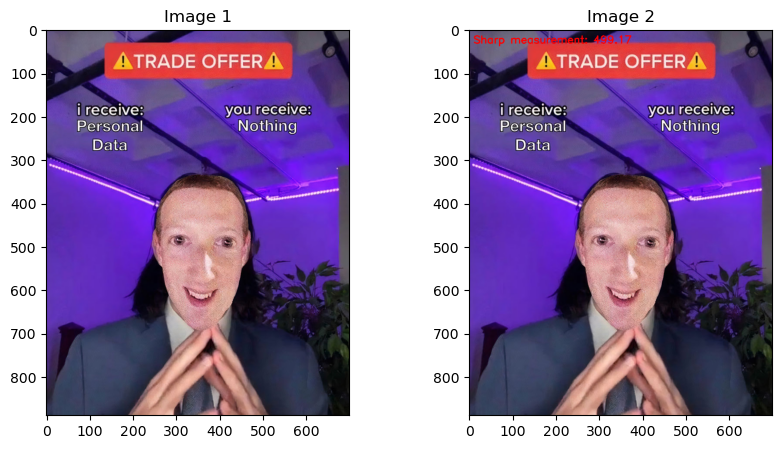

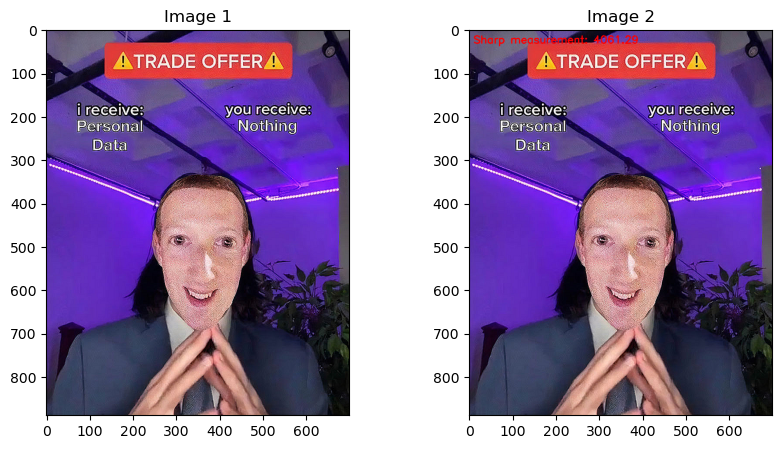

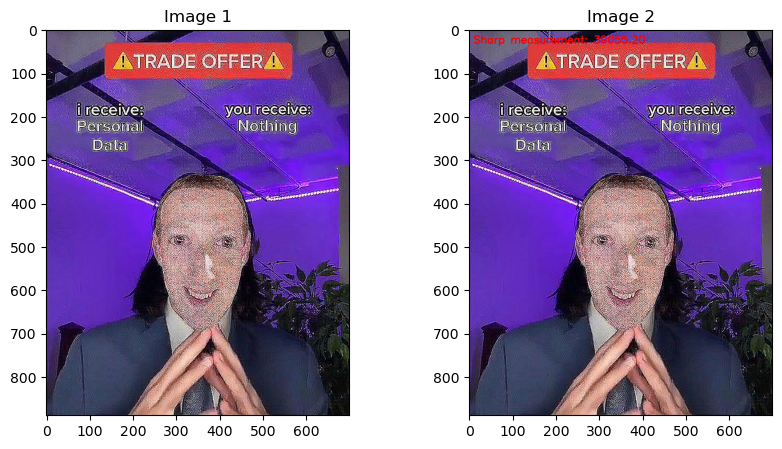

In [21]:
text = "Sharp measurement"
#ảnh gốc
input_measurement_text(color_img_2,text)

#ảnh sắc nét bằng kernel 3x3
input_measurement_text(sharp_image_filter_3x3_01,text)

#ảnh sắc nét bằng kernel 3x3 2 lần
input_measurement_text(sharp_image_filter_3x3_02,text)

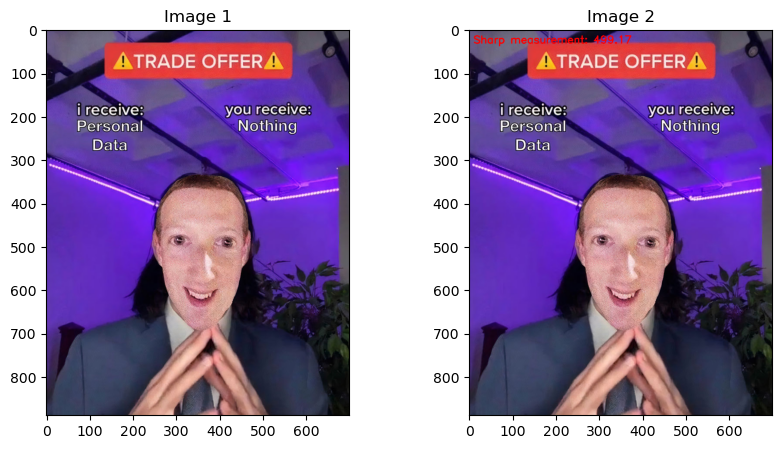

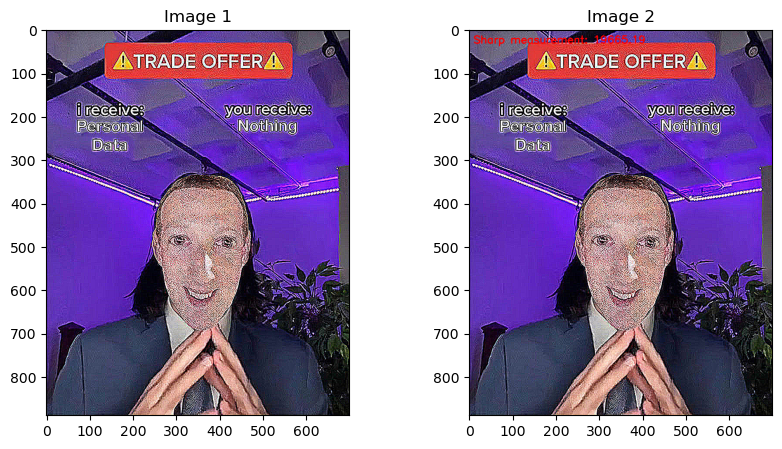

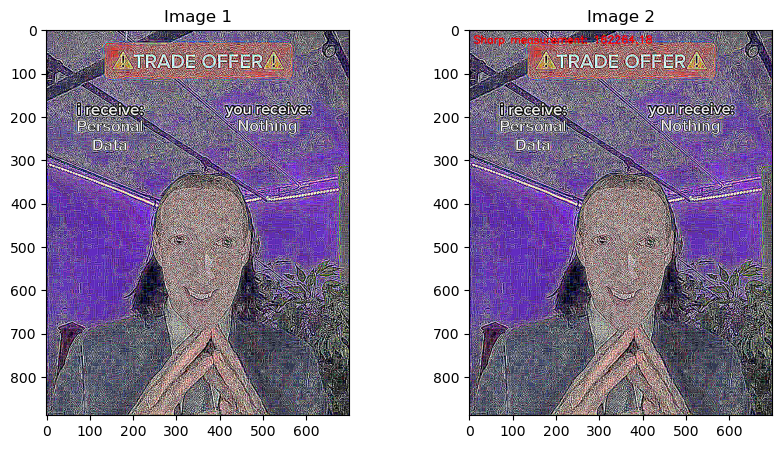

In [22]:
text = "Sharp measurement"
#ảnh gốc
input_measurement_text(color_img_2,text)

#ảnh sắc nét bằng kernel 5x5
input_measurement_text(sharp_image_filter_5x5_01,text)

#ảnh sắc nét bằng kernel 5x5 2 lần
input_measurement_text(sharp_image_filter_5x5_02,text)

# Bài 3 

In [23]:
import matplotlib.image as mpimg

def display_images_from_folder(input_folder_path,output_folder_path,threshold):
    # Lấy danh sách tất cả các tệp trong thư mục
    files = os.listdir(input_folder_path)
    
    # Lọc ra những tệp là hình ảnh
    images = [file for file in files if file.endswith(('jpeg', 'png', 'jpg', 'gif'))]
    
    # Duyệt qua từng hình ảnh
    for i, image in enumerate(images):
        # Đọc hình ảnh
        img_BRG = mpimg.imread(os.path.join(input_folder_path, image))
        img = cv2.cvtColor(img_BRG, cv2.COLOR_BGR2RGB) 
        #tính phương sai Laplacian
        blur = variance_of_Laplacian(img)
        if blur < threshold:
            text = 'Good image'
        else:
            text = 'Blur image'
        #Ghi giá trị mờ lên ảnh
        img_texted = img.copy()
        cv2.putText(img_texted, "{}: {:.2f}".format(text, blur), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
        
        # Lưu hình ảnh đã được ghi chú vào thư mục đầu ra
        cv2.imwrite(os.path.join(output_folder_path, 'image_{}.jpg'.format(i)), img_texted)


In [24]:
input_path = 'C:/Users/trand/Documents/Digital Image Processing/lab03/Image_Input'
output_path = 'C:/Users/trand/Documents/Digital Image Processing/lab03/Image_BlurDetection_Output' 
threshold = 100
display_images_from_folder(input_path,output_path,threshold)

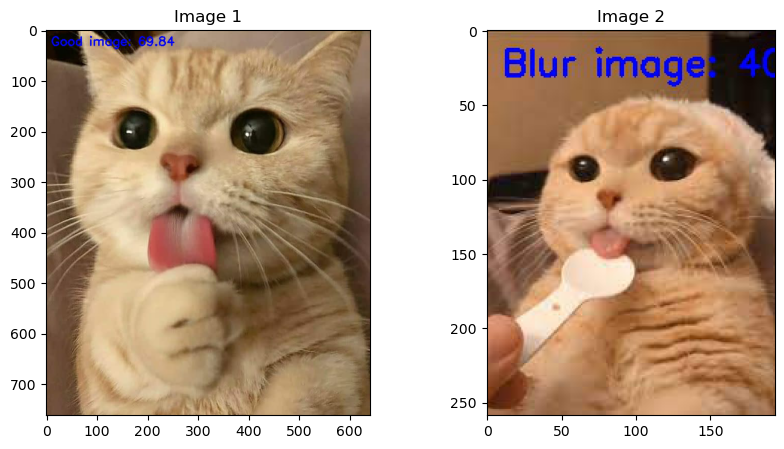

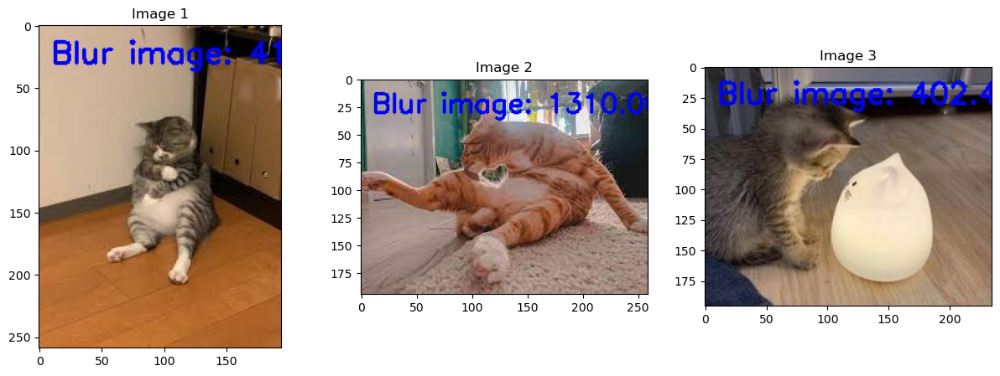

In [50]:
img1 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/lab03/Image_BlurDetection_Output/image_0.jpg')

img2 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/lab03/Image_BlurDetection_Output/image_1.jpg')

img3 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/lab03/Image_BlurDetection_Output/image_2.jpg')

img4 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/lab03/Image_BlurDetection_Output/image_3.jpg')

img5 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/lab03/Image_BlurDetection_Output/image_4.jpg')

show_images(img1,img2)
show_images(img3,img4,img5)


# Bài 4 

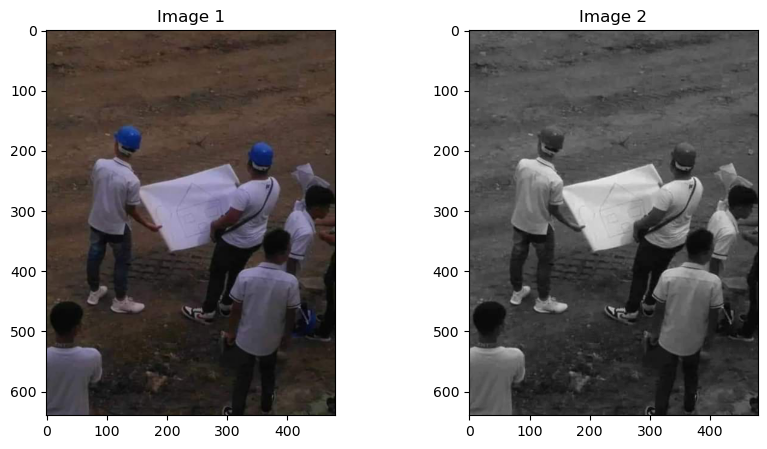

In [26]:
color_img_3 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/lab03/data/img3.jpg')
gray_img_3 = cv2.cvtColor(color_img_3, cv2.COLOR_RGB2GRAY)
show_images(color_img_3,gray_img_3)

In [27]:
# Tìm vị trí pixel có giá trị R, G, B max
r_max = np.unravel_index(np.argmax(color_img_3[:,:,2]), color_img_3[:,:,2].shape)
g_max = np.unravel_index(np.argmax(color_img_3[:,:,1]), color_img_3[:,:,1].shape)
b_max = np.unravel_index(np.argmax(color_img_3[:,:,0]), color_img_3[:,:,0].shape)

print(f"Vị trí R max: {r_max}")
print(f"Vị trí G max: {g_max}")
print(f"Vị trí B max: {b_max}")

Vị trí R max: (247, 223)
Vị trí G max: (247, 223)
Vị trí B max: (247, 223)


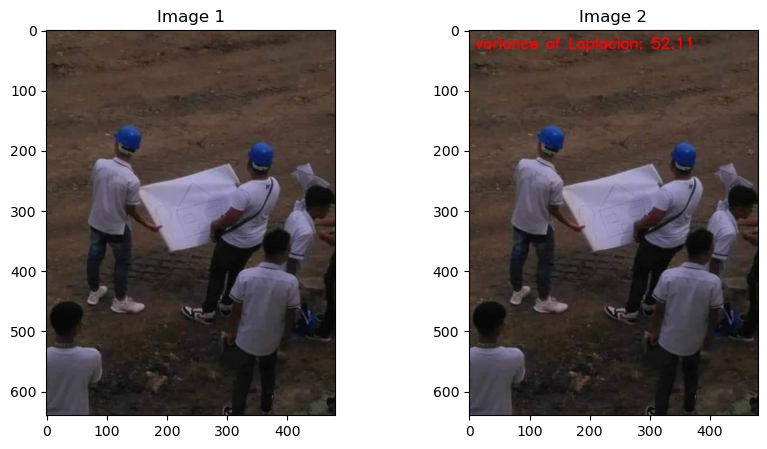

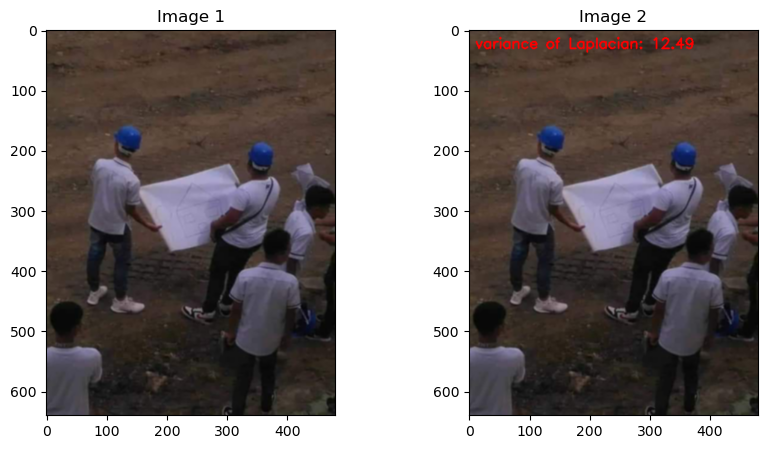

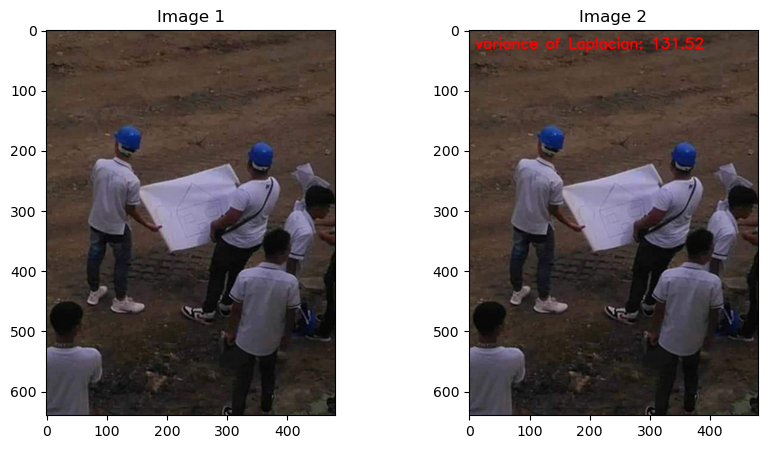

In [28]:
#ảnh màu gốc
text = "variance of Laplacian"
input_measurement_text(color_img_3,text)

#Làm mờ ảnh
image_filter_3x3_01_img_3 = cv2.filter2D(color_img_3,-1,kernel_3x3)
input_measurement_text(image_filter_3x3_01_img_3,text)

#làm rõ ảnh từ ảnh làm mờ trước đó
sharp_image_filter_3x3_01_img_3 = cv2.filter2D(image_filter_3x3_01_img_3,-1,sharp_kernel_3x3)
input_measurement_text(sharp_image_filter_3x3_01_img_3,text)

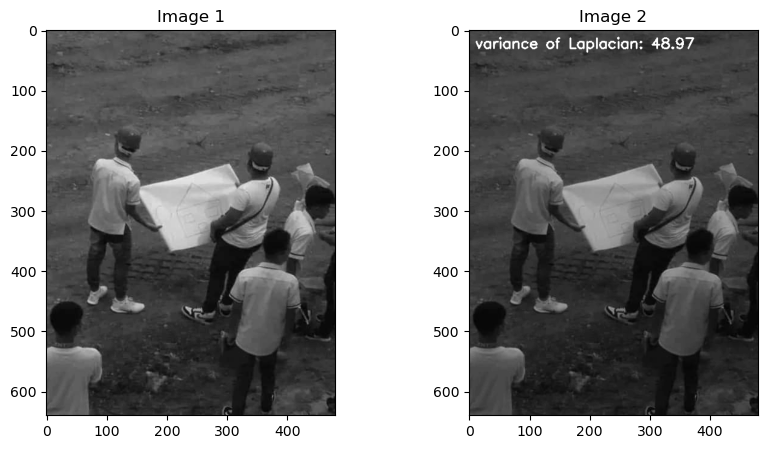

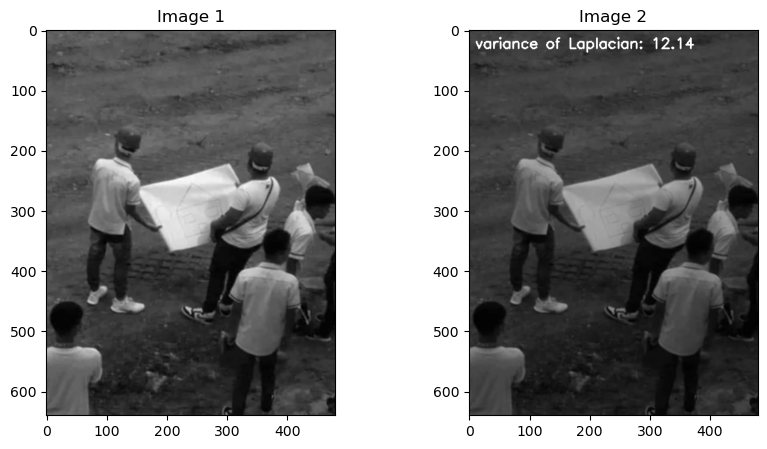

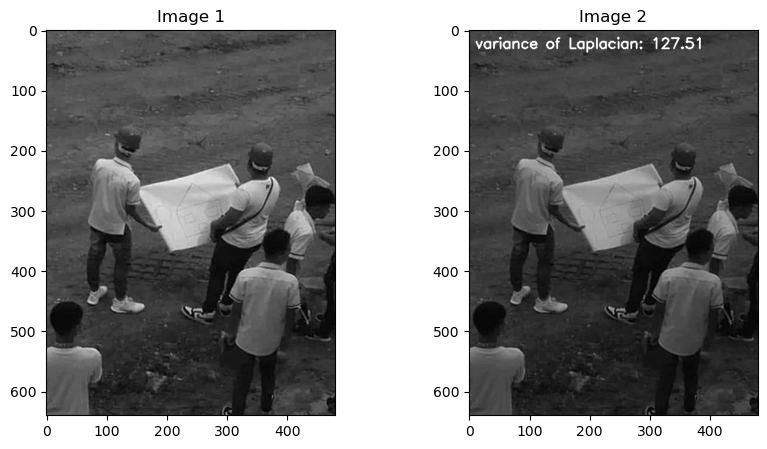

In [29]:
#ảnh xám gốc
text = "variance of Laplacian"
input_measurement_text(gray_img_3,text)

#Làm mờ ảnh
image_filter_3x3_01_gray_img_3 = cv2.filter2D(gray_img_3,-1,kernel_3x3)
input_measurement_text(image_filter_3x3_01_gray_img_3,text)

#làm rõ ảnh từ ảnh làm mờ trước đó
sharp_image_filter_3x3_01_img_3 = cv2.filter2D(image_filter_3x3_01_gray_img_3,-1,sharp_kernel_3x3)
input_measurement_text(sharp_image_filter_3x3_01_img_3,text)

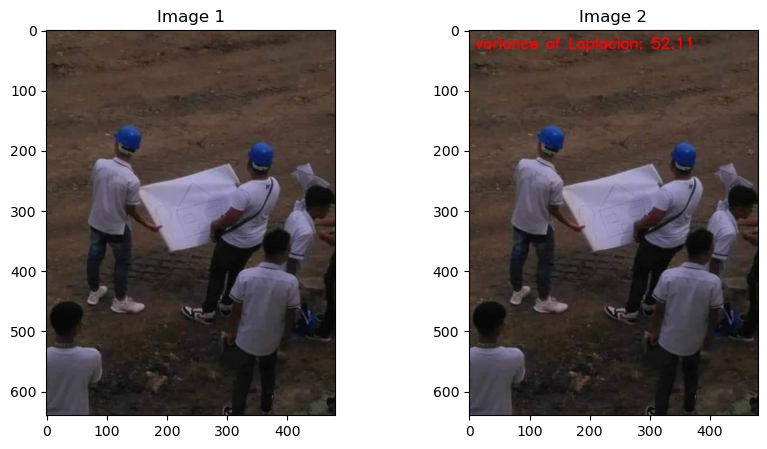

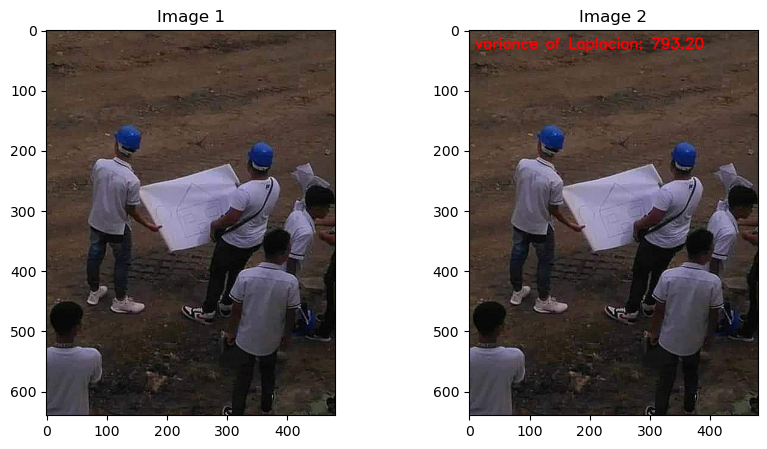

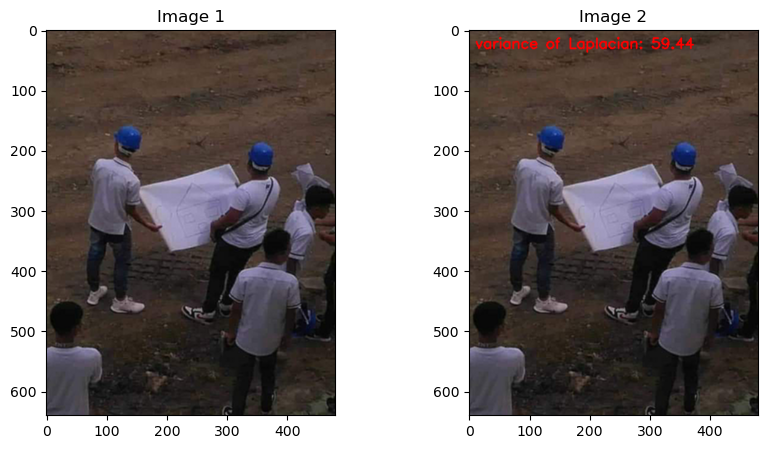

In [30]:
#ảnh màu gốc
text = "variance of Laplacian"
input_measurement_text(color_img_3,text)

#Làm rõ ảnh
image_filter_3x3_01_img_3_sharp = cv2.filter2D(color_img_3,-1,sharp_kernel_3x3)
input_measurement_text(image_filter_3x3_01_img_3_sharp,text)

#làm mờ ảnh từ ảnh làm rõ trước đó
blur_image_filter_3x3_01_img_3 = cv2.filter2D(image_filter_3x3_01_img_3_sharp,-1,kernel_3x3)
input_measurement_text(blur_image_filter_3x3_01_img_3,text)

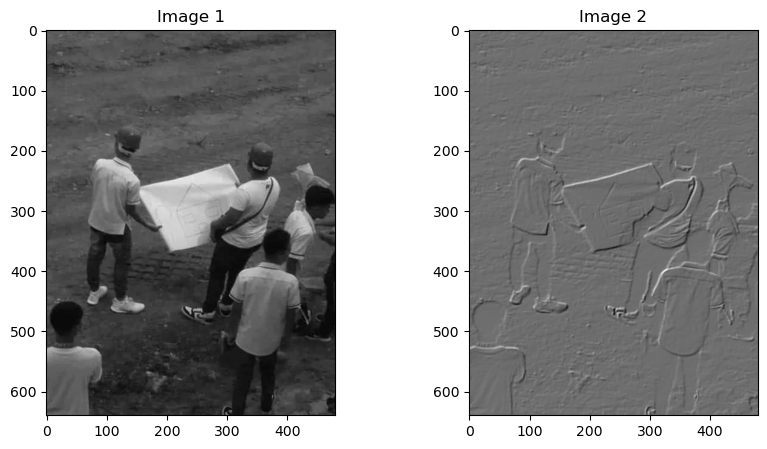

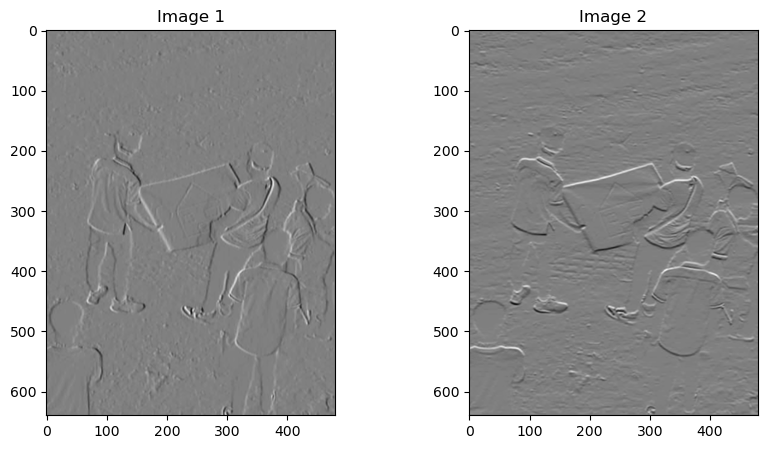

In [31]:
# Tìm cạnh ngang
sobelx = cv2.Sobel(gray_img_3,cv2.CV_64F,1,0,ksize=5)

# Tìm cạnh dọc
sobely = cv2.Sobel(gray_img_3,cv2.CV_64F,0,1,ksize=5)

# Tìm cạnh tổng
edges = sobelx + sobely
# Hiển thị ảnh
show_images(gray_img_3,edges)
            
show_images(sobelx,sobely)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


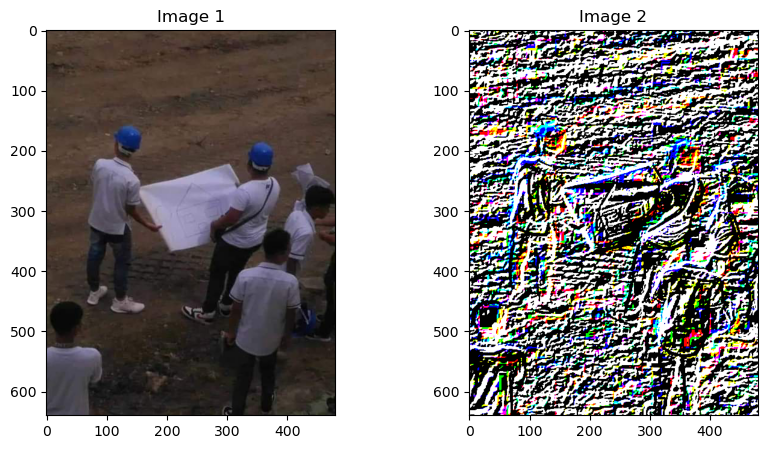

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


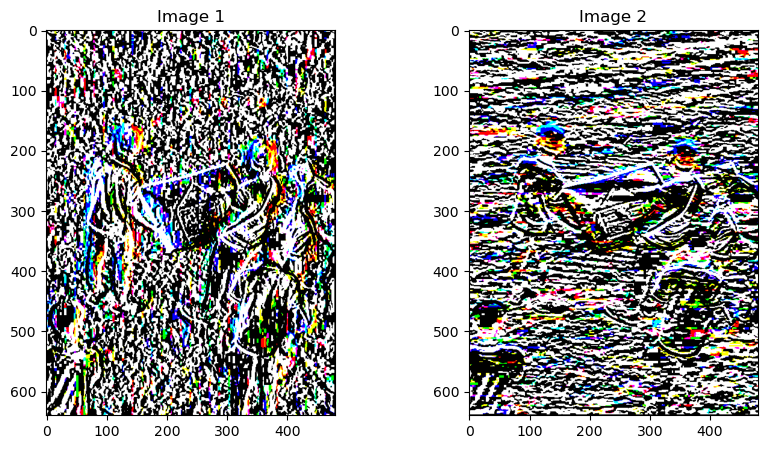

In [32]:
# Tìm cạnh ngang
sobelx = cv2.Sobel(color_img_3,cv2.CV_64F,1,0,ksize=5)

# Tìm cạnh dọc
sobely = cv2.Sobel(color_img_3,cv2.CV_64F,0,1,ksize=5)

# Tìm cạnh tổng
edges = sobelx + sobely
# Hiển thị ảnh
show_images(color_img_3,edges)
            
show_images(sobelx,sobely)

In [33]:
# construct the Laplacian kernel used to detect edge-like
# regions of an image
# construct the Sobel x-axis kernel
kernel_sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")
 
# construct the Sobel y-axis kernel
kernel_sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

In [34]:
image_edge_sobelX = cv2.filter2D(color_img_3, -1, kernel_sobelX)
image_edge_sobelY = cv2.filter2D(color_img_3, -1, kernel_sobelY)
image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY
show_images(color_img_3, image_color_edge)
show_images(image_edge_sobelX, image_edge_sobelY)

NameError: name 'image_color_edge_sobelX' is not defined

In [ ]:
image_gray_edge_sobelX = cv2.filter2D(gray_img_3, -1, kernel_sobelX)
image_gray_edge_sobelY = cv2.filter2D(gray_img_3, -1, kernel_sobelY)
image_gray_edge = image_color_edge_sobelX + image_color_edge_sobelY
show_images(gray_img_3, image_gray_edge)
show_images(image_gray_edge_sobelX, image_gray_edge_sobelY)